In [ ]:
# Needed for num_arrows in Streamplot (only available from matplotlib 3.11 and above)
# https://matplotlib.org/stable/gallery/images_contours_and_fields/plot_streamplot.html
!pip install --upgrade matplotlib

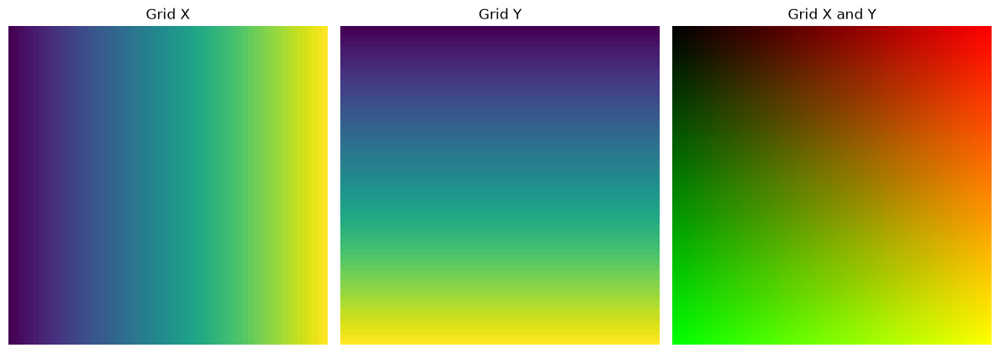

In [ ]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

def plot_output(ax, value, title = None, **kwargs):
    ax.imshow(value.detach().cpu().numpy(), **kwargs)
    if title: ax.set_title(title)
    ax.axis("off")

grid_size = (64, 64)

grid_x_vals, grid_y_vals = [torch.arange(sz, dtype=torch.float32) for sz in grid_size]
grid_y, grid_x = torch.meshgrid(grid_x_vals, grid_y_vals, indexing="ij")

fig, axes = plt.subplots(1, 3, figsize=(12, 3 * 2.6))

plot_output(axes[0], grid_x, f"Grid X")
plot_output(axes[1], grid_y, f"Grid Y")

def normalize(t):
    t_min, t_max = t.min(), t.max()
    return (t - t_min) / (t_max - t_min + 1e-8)

red = normalize(grid_x)
green = normalize(grid_y)
blue = torch.zeros_like(red)

plot_output(axes[2], torch.stack([red, green, blue], axis=-1), f"Grid X and Y")

fig.tight_layout()
plt.tight_layout()
plt.show()
plt.close()

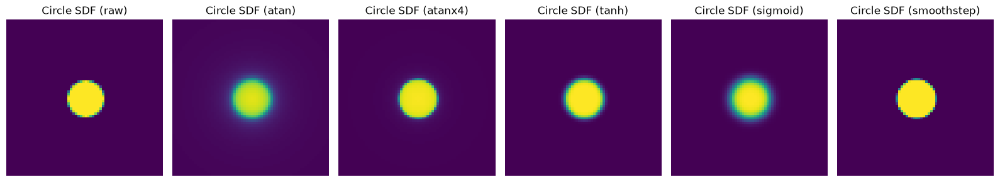

In [ ]:
pos_x = 32.0
pos_y = 32.0
radius = 8.0

epsilon = 1e-3

def sdf_circle(grid_x: torch.Tensor, grid_y: torch.Tensor, pos_x, pos_y, radius):
  return radius - torch.sqrt((grid_x - pos_x) ** 2 + (grid_y - pos_y) ** 2 + epsilon)

def smoothstep(edge0: torch.Tensor, edge1: torch.Tensor, x: torch.Tensor) -> torch.Tensor:
  t = torch.clamp((x - edge0) / (edge1 - edge0 + epsilon), 0.0, 1.0)
  return t * t * (3.0 - 2.0 * t)

def norm_atan(sdf): return torch.atan(sdf) / torch.pi + 0.5
def norm_atanx4(sdf): return torch.atan(sdf * 4) / torch.pi + 0.5
def norm_tanh(sdf): return torch.tanh(sdf) / 2 + 0.5
def norm_sigmoid(sdf): return torch.sigmoid(sdf)
def norm_smoothstep(sdf): return smoothstep(-0.5, 0.5, sdf)

sdf_raw = sdf_circle(grid_x, grid_y, pos_x, pos_y, radius)
sdf_atan = norm_atan(sdf_raw)
sdf_atanx4 = norm_atanx4(sdf_raw)
sdf_tanh = norm_tanh(sdf_raw)
sdf_sigmoid = norm_sigmoid(sdf_raw)
sdf_smoothstep = norm_smoothstep(sdf_raw)

fig, axes = plt.subplots(1, 6, figsize=(16, 6))

def plot_sdf_normalizations(axes):
  plot_output(axes[0], sdf_raw, f"Circle SDF (raw)", vmin=0, vmax=1)
  plot_output(axes[1], sdf_atan, f"Circle SDF (atan)", vmin=0, vmax=1)
  plot_output(axes[2], sdf_atanx4, f"Circle SDF (atanx4)", vmin=0, vmax=1)
  plot_output(axes[3], sdf_tanh, f"Circle SDF (tanh)", vmin=0, vmax=1)
  plot_output(axes[4], sdf_sigmoid, f"Circle SDF (sigmoid)", vmin=0, vmax=1)
  plot_output(axes[5], sdf_smoothstep, f"Circle SDF (smoothstep)", vmin=0, vmax=1)

plot_sdf_normalizations(axes)

fig.tight_layout()
plt.tight_layout()
plt.show()
plt.close()

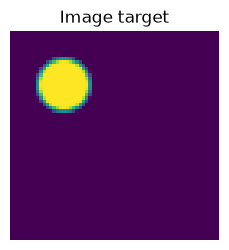

In [ ]:
target = sdf_circle(grid_x, grid_y, pos_x * 0.5, pos_y * 0.5, radius).clamp(-1, 1) / 2 + 0.5
fig, axes = plt.subplots(1, 1, figsize=(2.6, 2.6))

plot_output(axes, target, f"Image target", vmin=0, vmax=1)

fig.tight_layout()
plt.tight_layout()
plt.show()
plt.close()

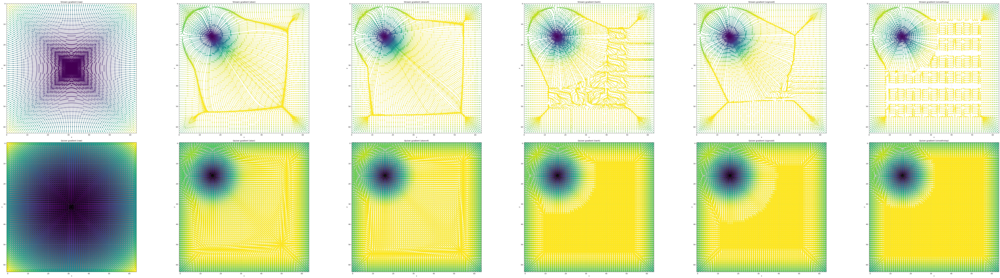

In [ ]:
# [types, grid_x, grid_y, parameters]
vector_field = torch.empty((6, *grid_size, 2))
# [types, grid_x, grid_y, 1]
loss_field = torch.empty((6, *grid_size, 1))

def write_grad(idx: int, gx_idx: int, gy_idx: int, sdf: torch.Tensor, params: list[torch.Tensor]):
  loss_l2 = nn.functional.mse_loss(sdf, target)
  gradients = torch.autograd.grad(loss_l2, params, retain_graph=True, allow_unused=True)
  vector_field[idx, gx_idx, gy_idx] = torch.tensor(gradients, dtype=torch.float)
  loss_field[idx, gx_idx, gy_idx] = loss_l2.detach().clone()

for gx_idx in range(grid_size[0]):
  for gy_idx in range(grid_size[1]):
    gx_val = grid_x[gx_idx, gy_idx].detach().clone().requires_grad_(True)
    gy_val = grid_y[gx_idx, gy_idx].detach().clone().requires_grad_(True)

    sdf_raw = sdf_circle(grid_x, grid_y, gx_val, gy_val, radius)
    sdf_atan = norm_atan(sdf_raw)
    sdf_atanx4 = norm_atanx4(sdf_raw)
    sdf_tanh = norm_tanh(sdf_raw)
    sdf_sigmoid = norm_sigmoid(sdf_raw)
    sdf_smoothstep = norm_smoothstep(sdf_raw)

    write_grad(0, gx_idx, gy_idx, sdf_raw, [gx_val, gy_val])
    write_grad(1, gx_idx, gy_idx, sdf_atan, [gx_val, gy_val])
    write_grad(2, gx_idx, gy_idx, sdf_atanx4, [gx_val, gy_val])
    write_grad(3, gx_idx, gy_idx, sdf_tanh, [gx_val, gy_val])
    write_grad(4, gx_idx, gy_idx, sdf_sigmoid, [gx_val, gy_val])
    write_grad(5, gx_idx, gy_idx, sdf_smoothstep, [gx_val, gy_val])

sdf_titles = ["raw", "atan", "atanx4", "tanh", "sigmoid", "smoothstep"]
fig, axes = plt.subplots(2, len(sdf_titles), figsize=(15 * len(sdf_titles), 6 * 4))

def plot_grad_quiver(ax, grid_x, grid_y, plot_x, plot_y, color, title, scale):
  ax.pcolormesh(grid_x, grid_y, color, cmap="viridis", shading="auto", alpha=1)
  ax.quiver(grid_x, grid_y, plot_x, -plot_y, color, cmap="grey", scale=scale, alpha=1)
  ax.set_xlabel("x")
  ax.set_ylabel("y")
  ax.set_title(title)
  ax.grid(alpha=0.3)
  ax.set_aspect("equal", adjustable="box")
  ax.invert_yaxis()

def plot_grad_stream(ax, grid_x, grid_y, plot_x, plot_y, color, title, scale):
  grid_x_np = grid_x.detach().cpu().numpy() if torch.is_tensor(grid_x) else grid_x
  grid_y_np = grid_y.detach().cpu().numpy() if torch.is_tensor(grid_y) else grid_y
  plot_x_np = plot_x.detach().cpu().numpy() if torch.is_tensor(plot_x) else plot_x
  plot_y_np = plot_y.detach().cpu().numpy() if torch.is_tensor(plot_y) else plot_y
  color_np = color.detach().cpu().numpy() if torch.is_tensor(color) else color

  ax.streamplot(grid_x_np, grid_y_np, plot_x_np, plot_y_np, color=color_np, cmap="viridis", density=2, num_arrows=16, broken_streamlines=False)
  ax.set_xlabel("x")
  ax.set_ylabel("y")
  ax.set_title(title)
  ax.grid(alpha=0.3)
  ax.set_aspect("equal", adjustable="box")
  ax.invert_yaxis()

for idx, name in enumerate(sdf_titles):
  vx = vector_field[idx, :, :, 0]
  vy = vector_field[idx, :, :, 1]

  magnitude = torch.sqrt(vx ** 2 + vy ** 2)
  vx_normalized = torch.where(magnitude <= 1e-6, torch.tensor(0.0), vx / magnitude)
  vy_normalized = torch.where(magnitude <= 1e-6, torch.tensor(0.0), vy / magnitude)

  fixed_display_length = 0.05
  vx_plot = fixed_display_length * vx_normalized
  vy_plot = fixed_display_length * vy_normalized
  color = loss_field[idx, :, :].squeeze(-1)

  plot_grad_stream(axes[0, idx], grid_x, grid_y, -vx, -vy, color, f"Stream gradient ({name})", scale=0.25)
  plot_grad_quiver(axes[1, idx], grid_x, grid_y, -vx_plot, -vy_plot, color, f"Quiver gradient ({name})", scale=1.50)

fig.tight_layout()
plt.show()
plt.close()

In [ ]:
import os, subprocess
from PIL import Image
from tqdm import tqdm

def convert_figure(fig):
  fig.canvas.draw()
  buffer = fig.canvas.buffer_rgba()
  sx, sy = fig.canvas.get_width_height()

  return Image.frombuffer("RGBA", (sx, sy), buffer, "raw", "RGBA", 0, 1)

def perform_combination_test(
  perform_run_fn,
  definition_list,
  definition_names,
  combination_list,
):
  for test_list_idx, test_case in enumerate(combination_list):
    test_enable = test_case["enable"]
    test_steps = test_case["steps"]
    test_name = test_case["name"]
    test_list = test_case["tests"]
    test_count = len(test_list)
    test_samples = []

    format_frame = "ppm"
    format_final = "webp"

    if not test_enable:
      continue

    for item in test_list:
      kw_args = {definition_names[idx]: definition_list[idx][key] for idx, key in enumerate(item)}
      samples = perform_run_fn(**kw_args, steps = test_steps)

      test_samples.append(samples)

    for sample_batch in tqdm(zip(*test_samples)):
      fig, axes = plt.subplots(2, test_count, figsize=(3 * test_count, 2.6 * 2))

      for test_idx, (step, sdf_norm, sdf_target, loss) in enumerate(sample_batch):
        run_setup = ", ".join(test_list[test_idx])
        plot_output(axes[0, test_idx], sdf_norm, f"{run_setup}\n[{step}] Loss: {loss:.6f}\nApprox", vmin=0, vmax=1)
        plot_output(axes[1, test_idx], sdf_norm - sdf_target, "Difference", vmin=-1, vmax=1)
        del sdf_norm

      fig.tight_layout()
      plt.tight_layout()
      convert_figure(fig).save(f"{test_name}.{step}.{format_frame}")
      plt.close()

    ffmpeg_cmd = f"ffmpeg -i '{test_name}.%d.{format_frame}' -framerate 25 -c:v libwebp -loop 0 {test_name}.{format_final} -y"
    print(subprocess.getoutput(ffmpeg_cmd))

    for idx in range(test_steps):
      os.remove(f"{test_name}.{idx}.{format_frame}")

In [ ]:
norm_table = {
  "smoothstep": norm_smoothstep,
  "atan": norm_atan,
  "atanx1.5": lambda sdf: torch.atan(sdf * 1.5) / torch.pi + 0.5,
  "atanx2": lambda sdf: torch.atan(sdf * 2) / torch.pi + 0.5,
  "atanx3": lambda sdf: torch.atan(sdf * 3) / torch.pi + 0.5,
  "atanx4": norm_atanx4,
  "tanh": norm_tanh,
  "sigmoid": norm_sigmoid,
}
optimizer_table = {
  "rmsprop": (torch.optim.RMSprop, { "lr": 0.1, "momentum": 0.5 }),
  "adam": (torch.optim.Adam, { "lr": 2.0, "betas": (0.95, 0.999) }),
  "adamw": (torch.optim.AdamW, { "lr": 2.0, "betas": (0.95, 0.999) }),
}
circle_init_table = {
  "centered": (30.0, 30.0, 8.0),
  "offset": (48.0, 48.0, 8.0),
}

def perform_circle_run(norm_setup, optim_setup, vars_setup, steps):
  print(norm_setup, optim_setup, vars_setup, steps)
  px_init, py_init, rad_init = vars_setup
  p_x = nn.Parameter(torch.tensor(px_init))
  p_y = nn.Parameter(torch.tensor(py_init))
  p_radius = nn.Parameter(torch.tensor(rad_init))

  optim_module, optim_params = optim_setup

  optimizer = optim_module([p_x, p_y, p_radius], **optim_params)

  for step in range(steps):
    optimizer.zero_grad()
    p_radius.data.clamp_(1, 64)
    sdf_raw = sdf_circle(grid_x, grid_y, p_x, p_y, p_radius)
    sdf_norm = norm_setup(sdf_raw)
    loss = nn.functional.mse_loss(sdf_norm, target)

    loss.backward()
    optimizer.step()

    yield (step, sdf_norm.detach().clone().cpu(), target, loss.item())

perform_combination_test(
  perform_circle_run,
  [norm_table, optimizer_table, circle_init_table],
  ["norm_setup", "optim_setup", "vars_setup"],
  [
    dict(
      enable = True, steps = 200,
      name = "test-run-centered-rmsprop",
      tests = [
        ("smoothstep", "rmsprop", "centered"),
        ("atan", "rmsprop", "centered"),
        ("atanx4", "rmsprop", "centered"),
        ("tanh", "rmsprop", "centered"),
        ("sigmoid", "rmsprop", "centered"),
      ]
    ),
    dict(
      enable = True, steps = 200,
      name = "test-run-centered-adam",
      tests = [
        ("smoothstep", "adam", "centered"),
        ("atan", "adam", "centered"),
        ("atanx4", "adam", "centered"),
        ("tanh", "adam", "centered"),
        ("sigmoid", "adam", "centered"),
      ]
    ),
    dict(
      enable = True, steps = 200,
      name = "test-run-offcenter-adam",
      tests = [
        ("smoothstep", "adam", "offset"),
        ("atan", "adam", "offset"),
        ("atanx4", "adam", "offset"),
        ("tanh", "adam", "offset"),
        ("sigmoid", "adam", "offset"),
      ]
    ),
  ]
)

0it [00:00, ?it/s]

<function norm_smoothstep at 0x7c66299fb600> (<class 'torch.optim.rmsprop.RMSprop'>, {'lr': 0.1, 'momentum': 0.5}) (30.0, 30.0, 8.0) 200
<function norm_atan at 0x7c66299fbd80> (<class 'torch.optim.rmsprop.RMSprop'>, {'lr': 0.1, 'momentum': 0.5}) (30.0, 30.0, 8.0) 200
<function norm_atanx4 at 0x7c66299fbba0> (<class 'torch.optim.rmsprop.RMSprop'>, {'lr': 0.1, 'momentum': 0.5}) (30.0, 30.0, 8.0) 200
<function norm_tanh at 0x7c66299fb880> (<class 'torch.optim.rmsprop.RMSprop'>, {'lr': 0.1, 'momentum': 0.5}) (30.0, 30.0, 8.0) 200
<function norm_sigmoid at 0x7c66299fbec0> (<class 'torch.optim.rmsprop.RMSprop'>, {'lr': 0.1, 'momentum': 0.5}) (30.0, 30.0, 8.0) 200


200it [02:01,  1.64it/s]


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

0it [00:00, ?it/s]

<function norm_smoothstep at 0x7c66299fb600> (<class 'torch.optim.adam.Adam'>, {'lr': 2.0, 'betas': (0.95, 0.999)}) (30.0, 30.0, 8.0) 200
<function norm_atan at 0x7c66299fbd80> (<class 'torch.optim.adam.Adam'>, {'lr': 2.0, 'betas': (0.95, 0.999)}) (30.0, 30.0, 8.0) 200
<function norm_atanx4 at 0x7c66299fbba0> (<class 'torch.optim.adam.Adam'>, {'lr': 2.0, 'betas': (0.95, 0.999)}) (30.0, 30.0, 8.0) 200
<function norm_tanh at 0x7c66299fb880> (<class 'torch.optim.adam.Adam'>, {'lr': 2.0, 'betas': (0.95, 0.999)}) (30.0, 30.0, 8.0) 200
<function norm_sigmoid at 0x7c66299fbec0> (<class 'torch.optim.adam.Adam'>, {'lr': 2.0, 'betas': (0.95, 0.999)}) (30.0, 30.0, 8.0) 200


200it [02:02,  1.63it/s]


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

0it [00:00, ?it/s]

<function norm_smoothstep at 0x7c66299fb600> (<class 'torch.optim.adam.Adam'>, {'lr': 2.0, 'betas': (0.95, 0.999)}) (48.0, 48.0, 8.0) 200
<function norm_atan at 0x7c66299fbd80> (<class 'torch.optim.adam.Adam'>, {'lr': 2.0, 'betas': (0.95, 0.999)}) (48.0, 48.0, 8.0) 200
<function norm_atanx4 at 0x7c66299fbba0> (<class 'torch.optim.adam.Adam'>, {'lr': 2.0, 'betas': (0.95, 0.999)}) (48.0, 48.0, 8.0) 200
<function norm_tanh at 0x7c66299fb880> (<class 'torch.optim.adam.Adam'>, {'lr': 2.0, 'betas': (0.95, 0.999)}) (48.0, 48.0, 8.0) 200
<function norm_sigmoid at 0x7c66299fbec0> (<class 'torch.optim.adam.Adam'>, {'lr': 2.0, 'betas': (0.95, 0.999)}) (48.0, 48.0, 8.0) 200


200it [01:55,  1.73it/s]


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

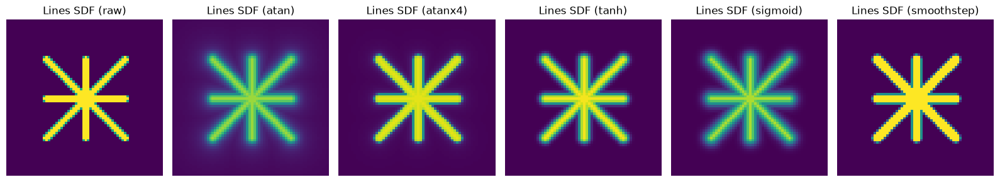

In [ ]:
def tensor_length(v):
  return torch.sqrt(torch.sum(v ** 2, dim=-1) + epsilon)

tensor_dot = torch.linalg.vecdot

def sdf_lines(grid_x: torch.Tensor, grid_y: torch.Tensor, a, b, r):
  grid = torch.cat([grid_x.unsqueeze(-1), grid_y.unsqueeze(-1)], dim=-1).unsqueeze(0)
  a = a[None, None].permute(2, 0, 1, 3)
  b = b[None, None].permute(2, 0, 1, 3)
  pa = (grid - a)
  ba = (b - a)
  h = (tensor_dot(pa, ba) / (tensor_dot(ba, ba) + epsilon)).clamp(0, 1).unsqueeze(-1)
  return -tensor_length(pa - ba * h).permute(1, 2, 0) + r.view(1, 1, -1)

v_a = torch.tensor([[16, 16], [16, 48], [32, 16], [16, 32]], dtype=torch.float32)
v_b = torch.tensor([[48, 48], [48, 16], [32, 48], [48, 32]], dtype=torch.float32)
v_r = torch.tensor([2, 2, 2, 2], dtype=torch.float32)

sdf_raw = sdf_lines(grid_x, grid_y, v_a, v_b, v_r).max(dim = -1).values
sdf_atan = norm_atan(sdf_raw)
sdf_atanx4 = norm_atanx4(sdf_raw)
sdf_tanh = norm_tanh(sdf_raw)
sdf_sigmoid = norm_sigmoid(sdf_raw)
sdf_smoothstep = norm_smoothstep(sdf_raw)

fig, axes = plt.subplots(1, 6, figsize=(16, 4))

def plot_sdf_normalizations(axes):
  plot_output(axes[0], sdf_raw, f"Lines SDF (raw)", vmin=0, vmax=1)
  plot_output(axes[1], sdf_atan, f"Lines SDF (atan)", vmin=0, vmax=1)
  plot_output(axes[2], sdf_atanx4, f"Lines SDF (atanx4)", vmin=0, vmax=1)
  plot_output(axes[3], sdf_tanh, f"Lines SDF (tanh)", vmin=0, vmax=1)
  plot_output(axes[4], sdf_sigmoid, f"Lines SDF (sigmoid)", vmin=0, vmax=1)
  plot_output(axes[5], sdf_smoothstep, f"Lines SDF (smoothstep)", vmin=0, vmax=1)

plot_sdf_normalizations(axes)

fig.tight_layout()
plt.tight_layout()
plt.show()
plt.close()


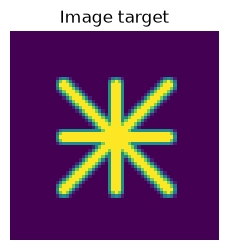

In [ ]:
line_target = sdf_lines(grid_x, grid_y, v_a, v_b, v_r).max(dim = -1).values.clamp(-1, 1) / 2 + 0.5
fig, axes = plt.subplots(1, 1, figsize=(2.6, 2.6))

plot_output(axes, line_target, f"Image target", vmin=0, vmax=1)

fig.tight_layout()
plt.tight_layout()
plt.show()
plt.close()

In [ ]:
line_init_table = {
  "rand": (
    [
      [50.89, 23.34], [44.91, 39.6], [59.01, 6.8], [28.55, 54.38],
      [42.0, 27.78], [5.16, 37.02], [4.78, 31.15], [48.51, 27.39],
      [36.28, 38.34], [3.47, 60.99], [5.04, 23.43], [4.98, 14.56],
      [38.42, 61.63], [61.46, 45.84], [20.01, 21.14], [30.59, 48.86]
    ],
    [
      [48.27, 21.45], [42.89, 41.65], [57.23, 10.7], [27.78, 65.48],
      [44.05, 34.26], [2.07, 35.97], [1.67, 33.31], [46.59, 28.99],
      [32.15, 47.97], [-2.64, 57.56], [11.03, 20.25], [9.8, 14.4],
      [44.39, 61.34], [58.65, 44.1], [20.69, 25.45], [21.08, 46.08]
    ],
    [
      1.5154, 1.1777, 0.6993, 0.8052, 1.0716, 0.6328, 0.6741, 0.3321,
      0.3307, 0.6558, 1.3163, 1.5220, 1.5364, 1.9526, 0.9107, 0.9901
    ],
  )
}
line_optimizer_table = {
  "rmsprop": (torch.optim.RMSprop, { "lr": 0.1, "momentum": 0.5 }),
  "adam": (torch.optim.Adam, { "lr": 0.5, "betas": (0.95, 0.999) }),
  "adamw": (torch.optim.AdamW, { "lr": 0.5, "betas": (0.95, 0.999) }),
}

def perform_line_run(norm_setup, optim_setup, vars_setup, steps):
  print(norm_setup, optim_setup, vars_setup, steps)
  pa_init, pb_init, rad_init = vars_setup
  p_a = nn.Parameter(torch.tensor(pa_init, dtype=torch.float32))
  p_b = nn.Parameter(torch.tensor(pb_init, dtype=torch.float32))
  p_radius = nn.Parameter(torch.tensor(rad_init))

  optim_module, optim_params = optim_setup

  optimizer = optim_module([p_a, p_b, p_radius], **optim_params)

  for step in range(steps):
    optimizer.zero_grad()
    sdf_raw = sdf_lines(grid_x, grid_y, p_a, p_b, p_radius).max(dim=-1).values
    sdf_norm = norm_setup(sdf_raw)
    loss = nn.functional.mse_loss(sdf_norm, line_target)

    loss.backward()
    optimizer.step()

    yield (step, sdf_norm.detach().clone().cpu(), line_target, loss.item())

perform_combination_test(
  perform_line_run,
  [norm_table, line_optimizer_table, line_init_table],
  ["norm_setup", "optim_setup", "vars_setup"],
  [
    dict(
      enable = True, steps = 200,
      name = "line-run-rand-adam",
      tests = [
        ("smoothstep", "adam", "rand"),
        ("atan", "adam", "rand"),
        ("atanx4", "adam", "rand"),
        ("tanh", "adam", "rand"),
        ("sigmoid", "adam", "rand"),
      ]
    ),
    dict(
      enable = True, steps = 200,
      name = "line-run-rand-adamw",
      tests = [
        ("smoothstep", "adamw", "rand"),
        ("atan", "adamw", "rand"),
        ("atanx4", "adamw", "rand"),
        ("tanh", "adamw", "rand"),
        ("sigmoid", "adamw", "rand"),
      ]
    ),
    dict(
      enable = True, steps = 200,
      name = "line-run-atanxn-adam",
      tests = [
        ("atan", "adam", "rand"),
        ("atanx1.5", "adam", "rand"),
        ("atanx2", "adam", "rand"),
        ("atanx3", "adam", "rand"),
        ("atanx4", "adam", "rand"),
      ]
    ),
  ]
)

0it [00:00, ?it/s]

<function norm_smoothstep at 0x7c66299fb600> (<class 'torch.optim.adam.Adam'>, {'lr': 0.5, 'betas': (0.95, 0.999)}) ([[50.89, 23.34], [44.91, 39.6], [59.01, 6.8], [28.55, 54.38], [42.0, 27.78], [5.16, 37.02], [4.78, 31.15], [48.51, 27.39], [36.28, 38.34], [3.47, 60.99], [5.04, 23.43], [4.98, 14.56], [38.42, 61.63], [61.46, 45.84], [20.01, 21.14], [30.59, 48.86]], [[48.27, 21.45], [42.89, 41.65], [57.23, 10.7], [27.78, 65.48], [44.05, 34.26], [2.07, 35.97], [1.67, 33.31], [46.59, 28.99], [32.15, 47.97], [-2.64, 57.56], [11.03, 20.25], [9.8, 14.4], [44.39, 61.34], [58.65, 44.1], [20.69, 25.45], [21.08, 46.08]], [1.5154, 1.1777, 0.6993, 0.8052, 1.0716, 0.6328, 0.6741, 0.3321, 0.3307, 0.6558, 1.3163, 1.522, 1.5364, 1.9526, 0.9107, 0.9901]) 200
<function norm_atan at 0x7c66299fbd80> (<class 'torch.optim.adam.Adam'>, {'lr': 0.5, 'betas': (0.95, 0.999)}) ([[50.89, 23.34], [44.91, 39.6], [59.01, 6.8], [28.55, 54.38], [42.0, 27.78], [5.16, 37.02], [4.78, 31.15], [48.51, 27.39], [36.28, 38.34], 

200it [02:19,  1.43it/s]


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

0it [00:00, ?it/s]

<function norm_smoothstep at 0x7c66299fb600> (<class 'torch.optim.adamw.AdamW'>, {'lr': 0.5, 'betas': (0.95, 0.999)}) ([[50.89, 23.34], [44.91, 39.6], [59.01, 6.8], [28.55, 54.38], [42.0, 27.78], [5.16, 37.02], [4.78, 31.15], [48.51, 27.39], [36.28, 38.34], [3.47, 60.99], [5.04, 23.43], [4.98, 14.56], [38.42, 61.63], [61.46, 45.84], [20.01, 21.14], [30.59, 48.86]], [[48.27, 21.45], [42.89, 41.65], [57.23, 10.7], [27.78, 65.48], [44.05, 34.26], [2.07, 35.97], [1.67, 33.31], [46.59, 28.99], [32.15, 47.97], [-2.64, 57.56], [11.03, 20.25], [9.8, 14.4], [44.39, 61.34], [58.65, 44.1], [20.69, 25.45], [21.08, 46.08]], [1.5154, 1.1777, 0.6993, 0.8052, 1.0716, 0.6328, 0.6741, 0.3321, 0.3307, 0.6558, 1.3163, 1.522, 1.5364, 1.9526, 0.9107, 0.9901]) 200
<function norm_atan at 0x7c66299fbd80> (<class 'torch.optim.adamw.AdamW'>, {'lr': 0.5, 'betas': (0.95, 0.999)}) ([[50.89, 23.34], [44.91, 39.6], [59.01, 6.8], [28.55, 54.38], [42.0, 27.78], [5.16, 37.02], [4.78, 31.15], [48.51, 27.39], [36.28, 38.3

200it [02:04,  1.61it/s]


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

0it [00:00, ?it/s]

<function norm_atan at 0x7c66299fbd80> (<class 'torch.optim.adam.Adam'>, {'lr': 0.5, 'betas': (0.95, 0.999)}) ([[50.89, 23.34], [44.91, 39.6], [59.01, 6.8], [28.55, 54.38], [42.0, 27.78], [5.16, 37.02], [4.78, 31.15], [48.51, 27.39], [36.28, 38.34], [3.47, 60.99], [5.04, 23.43], [4.98, 14.56], [38.42, 61.63], [61.46, 45.84], [20.01, 21.14], [30.59, 48.86]], [[48.27, 21.45], [42.89, 41.65], [57.23, 10.7], [27.78, 65.48], [44.05, 34.26], [2.07, 35.97], [1.67, 33.31], [46.59, 28.99], [32.15, 47.97], [-2.64, 57.56], [11.03, 20.25], [9.8, 14.4], [44.39, 61.34], [58.65, 44.1], [20.69, 25.45], [21.08, 46.08]], [1.5154, 1.1777, 0.6993, 0.8052, 1.0716, 0.6328, 0.6741, 0.3321, 0.3307, 0.6558, 1.3163, 1.522, 1.5364, 1.9526, 0.9107, 0.9901]) 200
<function <lambda> at 0x7c65ef7bd580> (<class 'torch.optim.adam.Adam'>, {'lr': 0.5, 'betas': (0.95, 0.999)}) ([[50.89, 23.34], [44.91, 39.6], [59.01, 6.8], [28.55, 54.38], [42.0, 27.78], [5.16, 37.02], [4.78, 31.15], [48.51, 27.39], [36.28, 38.34], [3.47, 

200it [02:12,  1.51it/s]


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

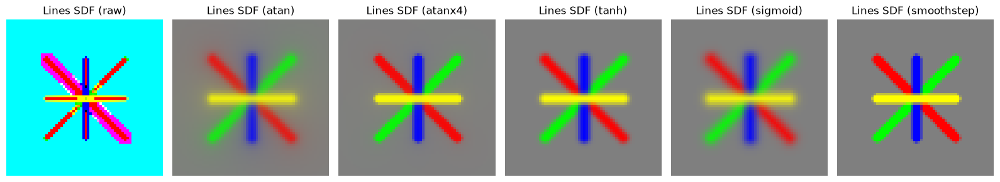

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
def sdf_compose(masks, colors, bg_color):
  canvas = bg_color.expand(*masks.shape[:2], 3).clone()
  colors = colors.unsqueeze(-1).unsqueeze(-1)
  colors = colors.permute(0, 2, 3, 1)
  masks = masks.permute(2, 0, 1).unsqueeze(-1)

  for mask, color in zip(masks, colors):
    canvas = canvas * (1 - mask) + color * mask

  return canvas

def sdf_compose_dbg(masks, colors, bg_color):
  canvas = bg_color.expand(*masks.shape[:2], 3).clone()
  colors = colors.unsqueeze(-1).unsqueeze(-1)
  colors = colors.permute(0, 2, 3, 1)
  masks = masks.permute(2, 0, 1).unsqueeze(-1)

  intermediate_0 = []
  intermediate_1 = []
  canvas_snapshots = []

  for mask, color in zip(masks, colors):
    i_0 = canvas * (1 - mask)
    i_1 = color * mask
    canvas = i_0 + i_1
    intermediate_0.append(i_0.clone())
    intermediate_1.append(i_1.clone())
    canvas_snapshots.append(canvas.clone())

  return canvas, intermediate_0, intermediate_1, canvas_snapshots

v_a = torch.tensor([[16, 16], [16, 48], [32, 16], [16, 32]], dtype=torch.float32)
v_b = torch.tensor([[48, 48], [48, 16], [32, 48], [48, 32]], dtype=torch.float32)
v_r = torch.tensor([2, 2, 2, 2], dtype=torch.float32)
v_c = torch.tensor([[1, 0, 0], [0, 1, 0], [0, 0, 1], [1, 1, 0]], dtype=torch.float32)
v_bg = torch.tensor([0.5, 0.5, 0.5], dtype=torch.float32)

sdf_src = sdf_lines(grid_x, grid_y, v_a, v_b, v_r)
sdf_raw = sdf_compose_dbg(sdf_src, v_c, v_bg)
sdf_atan = sdf_compose_dbg(norm_atan(sdf_src), v_c, v_bg)
sdf_atanx4 = sdf_compose_dbg(norm_atanx4(sdf_src), v_c, v_bg)
sdf_tanh = sdf_compose_dbg(norm_tanh(sdf_src), v_c, v_bg)
sdf_sigmoid = sdf_compose_dbg(norm_sigmoid(sdf_src), v_c, v_bg)
sdf_smoothstep = sdf_compose_dbg(norm_smoothstep(sdf_src), v_c, v_bg)

norm_funcs = ["raw", "atan", "atanx4", "tanh", "sigmoid", "smoothstep"]
norm_list = [sdf_raw, sdf_atan, sdf_atanx4, sdf_tanh, sdf_sigmoid, sdf_smoothstep]

fig, axes = plt.subplots(1, len(norm_funcs), figsize=(16, 4))

def plot_sdf_normalizations(axes):
  for norm_idx, norm_name in enumerate(norm_funcs):
    norm_item = norm_list[norm_idx]
    plot_output(axes[norm_idx], norm_item[0], f"Lines SDF ({norm_name})", vmin=0, vmax=1)

plot_sdf_normalizations(axes)

fig.tight_layout()
plt.tight_layout()
plt.show()
plt.close()

for frame_idx in range(v_r.shape[0]):
  fig, axes = plt.subplots(3, len(norm_funcs), figsize=(16, 4 * 3))

  for norm_idx, norm_name in enumerate(norm_funcs):
    norm_item = norm_list[norm_idx]
    plot_output(axes[0, norm_idx], norm_item[1][frame_idx], f"Intermediate 0 ({norm_name})", vmin=0, vmax=1)
    plot_output(axes[1, norm_idx], norm_item[2][frame_idx], f"Intermediate 1 ({norm_name})", vmin=0, vmax=1)
    plot_output(axes[2, norm_idx], norm_item[3][frame_idx], f"Canvas ({norm_name})", vmin=0, vmax=1)

  fig.tight_layout()
  plt.tight_layout()
  plt.savefig(f"frame-{frame_idx}.png")
  plt.close()

ffmpeg_cmd = f"ffmpeg -framerate 1 -i 'frame-%d.png' -c:v libwebp -loop 0 rgb-composition-animated.webp -y"
print(subprocess.getoutput(ffmpeg_cmd))

for idx in range(v_r.shape[0]):
  os.remove(f"frame-{idx}.png")

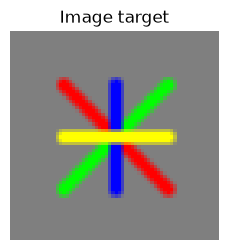

In [ ]:
sdf_rgb_line_target = sdf_compose(sdf_src.clamp(-1, 1) / 2 + 0.5, v_c, v_bg)
fig, axes = plt.subplots(1, 1, figsize=(2.6, 2.6))

plot_output(axes, sdf_rgb_line_target, f"Image target", vmin=0, vmax=1)

fig.tight_layout()
plt.tight_layout()
plt.show()
plt.close()


In [ ]:
line_rgb_optimizer_table = {
  "adam": (torch.optim.Adam, { "lr": 0.2, "betas": (0.99, 0.999) }),
  "rmsprop": (torch.optim.RMSprop, { "lr": 0.1, "momentum": 0.5 }),
}
line_rgb_init_table = {
  "rand": (
    [0.5, 0.5, 0.5],
    [
      [50.89, 23.34], [44.91, 39.6], [59.01, 6.8], [28.55, 54.38],
      [42.0, 27.78], [5.16, 37.02], [4.78, 31.15], [48.51, 27.39],
      [36.28, 38.34], [3.47, 60.99], [5.04, 23.43], [4.98, 14.56],
      [38.42, 61.63], [61.46, 45.84], [20.01, 21.14], [30.59, 48.86]
    ],
    [
      [48.27, 21.45], [42.89, 41.65], [57.23, 10.7], [27.78, 65.48],
      [44.05, 34.26], [2.07, 35.97], [1.67, 33.31], [46.59, 28.99],
      [32.15, 47.97], [-2.64, 57.56], [11.03, 20.25], [9.8, 14.4],
      [44.39, 61.34], [58.65, 44.1], [20.69, 25.45], [21.08, 46.08]
    ],
    [
      1.5154, 1.1777, 0.6993, 0.8052, 1.0716, 0.6328, 0.6741, 0.3321,
      0.3307, 0.6558, 1.3163, 1.5220, 1.5364, 1.9526, 0.9107, 0.9901
    ],
    [
      [0.5933, 0.5692, 0.3209], [0.9327, 0.7521, 0.4041],
      [0.9152, 0.4044, 0.0220], [0.1079, 0.2803, 0.6171],
      [0.7582, 0.4373, 0.2063], [0.0905, 0.4621, 0.8894],
      [0.0458, 0.8928, 0.2039], [0.1325, 0.5149, 0.7919],
      [0.4595, 0.2782, 0.5788], [0.3481, 0.1643, 0.2250],
      [0.2303, 0.0151, 0.5339], [0.0256, 0.2561, 0.2942],
      [0.2490, 0.0358, 0.6182], [0.1976, 0.3422, 0.3126],
      [0.3565, 0.8921, 0.1350], [0.7460, 0.9681, 0.1479],
    ],
  )
}

def perform_line_run(norm_setup, optim_setup, vars_setup, steps):
  print(norm_setup, optim_setup, vars_setup, steps)
  p_bg_col_init, pa_init, pb_init, rad_init, col_init = vars_setup
  p_a = nn.Parameter(torch.tensor(pa_init, dtype=torch.float32))
  p_b = nn.Parameter(torch.tensor(pb_init, dtype=torch.float32))
  p_radius = nn.Parameter(torch.tensor(rad_init, dtype=torch.float32))
  p_color = nn.Parameter(torch.tensor(col_init, dtype=torch.float32))
  p_bg_color = nn.Parameter(torch.tensor(p_bg_col_init, dtype=torch.float32))

  optim_module, optim_params = optim_setup

  optimizer = optim_module([p_a, p_b, p_radius, p_color, p_bg_color], **optim_params)

  for step in range(steps):
    optimizer.zero_grad()

    sdf_raw = sdf_lines(grid_x, grid_y, p_a, p_b, p_radius)
    sdf_norm = norm_setup(sdf_raw)
    sdf_composed = sdf_compose(sdf_norm, p_color, p_bg_color)
    loss = nn.functional.mse_loss(sdf_composed, sdf_rgb_line_target)

    loss.backward()
    optimizer.step()

    with torch.no_grad():
      p_radius.data.clamp_(0.1, 8)
      p_color.data.clamp_(0, 1)
      p_bg_color.data.clamp_(0, 1)

    yield (step, sdf_composed.detach().clone().cpu(), sdf_rgb_line_target, loss.item())

perform_combination_test(
  perform_line_run,
  [norm_table, line_rgb_optimizer_table, line_rgb_init_table],
  ["norm_setup", "optim_setup", "vars_setup"],
  [
    dict(
      enable = True, steps = 400,
      name = "line-rgb-run-rand-adam",
      tests = [
        ("smoothstep", "adam", "rand"),
        ("atan", "adam", "rand"),
        ("atanx4", "adam", "rand"),
        ("tanh", "adam", "rand"),
        ("sigmoid", "adam", "rand"),
      ]
    ),
    dict(
      enable = True, steps = 400,
      name = "line-rgb-run-atanxn-adam",
      tests = [
        ("atan", "adam", "rand"),
        ("atanx1.5", "adam", "rand"),
        ("atanx2", "adam", "rand"),
        ("atanx3", "adam", "rand"),
        ("atanx4", "adam", "rand"),
      ]
    ),
    dict(
      enable = True, steps = 400,
      name = "line-rgb-run-rand-rmsprop",
      tests = [
        ("smoothstep", "rmsprop", "rand"),
        ("atan", "rmsprop", "rand"),
        ("atanx4", "rmsprop", "rand"),
        ("tanh", "rmsprop", "rand"),
        ("sigmoid", "rmsprop", "rand"),
      ]
    ),
  ]
)

0it [00:00, ?it/s]

<function norm_smoothstep at 0x7c66299fb600> (<class 'torch.optim.adam.Adam'>, {'lr': 0.2, 'betas': (0.99, 0.999)}) ([0.5, 0.5, 0.5], [[50.89, 23.34], [44.91, 39.6], [59.01, 6.8], [28.55, 54.38], [42.0, 27.78], [5.16, 37.02], [4.78, 31.15], [48.51, 27.39], [36.28, 38.34], [3.47, 60.99], [5.04, 23.43], [4.98, 14.56], [38.42, 61.63], [61.46, 45.84], [20.01, 21.14], [30.59, 48.86]], [[48.27, 21.45], [42.89, 41.65], [57.23, 10.7], [27.78, 65.48], [44.05, 34.26], [2.07, 35.97], [1.67, 33.31], [46.59, 28.99], [32.15, 47.97], [-2.64, 57.56], [11.03, 20.25], [9.8, 14.4], [44.39, 61.34], [58.65, 44.1], [20.69, 25.45], [21.08, 46.08]], [1.5154, 1.1777, 0.6993, 0.8052, 1.0716, 0.6328, 0.6741, 0.3321, 0.3307, 0.6558, 1.3163, 1.522, 1.5364, 1.9526, 0.9107, 0.9901], [[0.5933, 0.5692, 0.3209], [0.9327, 0.7521, 0.4041], [0.9152, 0.4044, 0.022], [0.1079, 0.2803, 0.6171], [0.7582, 0.4373, 0.2063], [0.0905, 0.4621, 0.8894], [0.0458, 0.8928, 0.2039], [0.1325, 0.5149, 0.7919], [0.4595, 0.2782, 0.5788], [0.

1it [00:00,  1.17it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6999999..0.69999915].
2it [00:01,  1.19it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8308126..0.8558769].
3it [00:02,  1.18it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8279864..0.81731033].
4it [00:03,  1.32it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.79744685..0.7562405].
5it [00:03,  1.46it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7238264..0.68026555].
6it [00:04,  1.54it/s]WARNING:matplo

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

0it [00:00, ?it/s]

<function norm_atan at 0x7c66299fbd80> (<class 'torch.optim.adam.Adam'>, {'lr': 0.2, 'betas': (0.99, 0.999)}) ([0.5, 0.5, 0.5], [[50.89, 23.34], [44.91, 39.6], [59.01, 6.8], [28.55, 54.38], [42.0, 27.78], [5.16, 37.02], [4.78, 31.15], [48.51, 27.39], [36.28, 38.34], [3.47, 60.99], [5.04, 23.43], [4.98, 14.56], [38.42, 61.63], [61.46, 45.84], [20.01, 21.14], [30.59, 48.86]], [[48.27, 21.45], [42.89, 41.65], [57.23, 10.7], [27.78, 65.48], [44.05, 34.26], [2.07, 35.97], [1.67, 33.31], [46.59, 28.99], [32.15, 47.97], [-2.64, 57.56], [11.03, 20.25], [9.8, 14.4], [44.39, 61.34], [58.65, 44.1], [20.69, 25.45], [21.08, 46.08]], [1.5154, 1.1777, 0.6993, 0.8052, 1.0716, 0.6328, 0.6741, 0.3321, 0.3307, 0.6558, 1.3163, 1.522, 1.5364, 1.9526, 0.9107, 0.9901], [[0.5933, 0.5692, 0.3209], [0.9327, 0.7521, 0.4041], [0.9152, 0.4044, 0.022], [0.1079, 0.2803, 0.6171], [0.7582, 0.4373, 0.2063], [0.0905, 0.4621, 0.8894], [0.0458, 0.8928, 0.2039], [0.1325, 0.5149, 0.7919], [0.4595, 0.2782, 0.5788], [0.3481, 

1it [00:00,  1.12it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.69540596..0.67877305].
2it [00:01,  1.17it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.61258316..0.6301397].
3it [00:02,  1.14it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.74894166..0.7434359].
4it [00:03,  1.15it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.77873814..0.7615962].
5it [00:04,  1.30it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7501722..0.7101692].
6it [00:04,  1.43it/s]WARNING:matpl

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

0it [00:00, ?it/s]

<function norm_smoothstep at 0x7c66299fb600> (<class 'torch.optim.rmsprop.RMSprop'>, {'lr': 0.1, 'momentum': 0.5}) ([0.5, 0.5, 0.5], [[50.89, 23.34], [44.91, 39.6], [59.01, 6.8], [28.55, 54.38], [42.0, 27.78], [5.16, 37.02], [4.78, 31.15], [48.51, 27.39], [36.28, 38.34], [3.47, 60.99], [5.04, 23.43], [4.98, 14.56], [38.42, 61.63], [61.46, 45.84], [20.01, 21.14], [30.59, 48.86]], [[48.27, 21.45], [42.89, 41.65], [57.23, 10.7], [27.78, 65.48], [44.05, 34.26], [2.07, 35.97], [1.67, 33.31], [46.59, 28.99], [32.15, 47.97], [-2.64, 57.56], [11.03, 20.25], [9.8, 14.4], [44.39, 61.34], [58.65, 44.1], [20.69, 25.45], [21.08, 46.08]], [1.5154, 1.1777, 0.6993, 0.8052, 1.0716, 0.6328, 0.6741, 0.3321, 0.3307, 0.6558, 1.3163, 1.522, 1.5364, 1.9526, 0.9107, 0.9901], [[0.5933, 0.5692, 0.3209], [0.9327, 0.7521, 0.4041], [0.9152, 0.4044, 0.022], [0.1079, 0.2803, 0.6171], [0.7582, 0.4373, 0.2063], [0.0905, 0.4621, 0.8894], [0.0458, 0.8928, 0.2039], [0.1325, 0.5149, 0.7919], [0.4595, 0.2782, 0.5788], [0.3

<function norm_tanh at 0x7c66299fb880> (<class 'torch.optim.rmsprop.RMSprop'>, {'lr': 0.1, 'momentum': 0.5}) ([0.5, 0.5, 0.5], [[50.89, 23.34], [44.91, 39.6], [59.01, 6.8], [28.55, 54.38], [42.0, 27.78], [5.16, 37.02], [4.78, 31.15], [48.51, 27.39], [36.28, 38.34], [3.47, 60.99], [5.04, 23.43], [4.98, 14.56], [38.42, 61.63], [61.46, 45.84], [20.01, 21.14], [30.59, 48.86]], [[48.27, 21.45], [42.89, 41.65], [57.23, 10.7], [27.78, 65.48], [44.05, 34.26], [2.07, 35.97], [1.67, 33.31], [46.59, 28.99], [32.15, 47.97], [-2.64, 57.56], [11.03, 20.25], [9.8, 14.4], [44.39, 61.34], [58.65, 44.1], [20.69, 25.45], [21.08, 46.08]], [1.5154, 1.1777, 0.6993, 0.8052, 1.0716, 0.6328, 0.6741, 0.3321, 0.3307, 0.6558, 1.3163, 1.522, 1.5364, 1.9526, 0.9107, 0.9901], [[0.5933, 0.5692, 0.3209], [0.9327, 0.7521, 0.4041], [0.9152, 0.4044, 0.022], [0.1079, 0.2803, 0.6171], [0.7582, 0.4373, 0.2063], [0.0905, 0.4621, 0.8894], [0.0458, 0.8928, 0.2039], [0.1325, 0.5149, 0.7919], [0.4595, 0.2782, 0.5788], [0.3481, 0

1it [00:00,  1.66it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
2it [00:01,  1.61it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.84461176..0.84344244].
3it [00:01,  1.63it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
4it [00:03,  1.02it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.750477..0.5837655].
5it [00:05,  1.30s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.94608486..0.6658576].
6it [00:07,  1.76s/it]WARNING:matplotlib.image:Clipping input 

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab